# Monitoring The Progress of the COVID-19 Pandemic

## A Julia Data Analysis Tutorial
## By Daniel Lakeland
## Lakeland Applied Sciences LLC


As a mathematical modeler and data analyst many of my friends have
asked me questions about what is going on with the COVID pandemic. On
my blog I've posted some graphs as PDFs with updates every few weeks,
but it's more convenient to give my friends and family an executable
Jupyter notebook where they can update to the latest data any time
they want. Let's get started by grabbing the daily data for all states
from the [Covid Tracking Project](https://covidtracking.com/)

We'll use the
[Vegalite graphics library](https://vega.github.io/vega-lite/docs/)
this time with the
[@vlplot](https://www.queryverse.org/VegaLite.jl/stable/userguide/vlplotmacro/)
macro.

In [1]:
using Queryverse

usdata = "https://covidtracking.com/api/v1/states/daily.csv"

dat = DataFrame(load(usdata))

display(first(dat,5))

,date,state,positive,negative,pending,hospitalizedCurrently,hospitalizedCumulative
,Int64,String,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰
1,20200613,AK,654,71149,missing,12,missing
2,20200613,AL,24601,268651,missing,622,2241
3,20200613,AR,11547,175470,missing,203,979
4,20200613,AS,0,174,missing,missing,missing
5,20200613,AZ,34458,293939,missing,1412,3692


# Understanding the Data

The Covid Tracking Project aggregates data from all the states on
various important measures. For the moment let's focus on daily
positive tests, the ratio of total tests to positive tests, the number
of hospitalized patients, and the number of deaths per day. 

Let's figure out which columns those correspond to:

In [2]:
println(names(dat))

using Dates

function convdate(d::Int)
    return(Date(div(d,10000),div(mod(d,10000),100),mod(d,100)));
end

dat2 = dat |> @mutate(thedate=convdate(_.date)) |> DataFrame

allstates = unique(dat.state);

[:date, :state, :positive, :negative, :pending, :hospitalizedCurrently, :hospitalizedCumulative, :inIcuCurrently, :inIcuCumulative, :onVentilatorCurrently, :onVentilatorCumulative, :recovered, :dataQualityGrade, :lastUpdateEt, :dateModified, :checkTimeEt, :death, :hospitalized, :dateChecked, :totalTestsViral, :positiveTestsViral, :negativeTestsViral, :positiveCasesViral, :fips, :positiveIncrease, :negativeIncrease, :total, :totalTestResults, :totalTestResultsIncrease, :posNeg, :deathIncrease, :hospitalizedIncrease, :hash, :commercialScore, :negativeRegularScore, :negativeScore, :positiveScore, :score, :grade]


Let's create a function that plots percentage positive, positive per
day, and deaths per day for a given state...

In [3]:
function plotstate(df,state)
    dfstate = df |> @filter(_.state == state) |> 
        @mutate(testpct=_.positiveIncrease/(_.totalTestResultsIncrease+.1)) |>
        @select(:thedate,:state,:testpct,:positiveIncrease,:deathIncrease)|>DataFrame

    testing = @vlplot(width=300,layer=[],title="Testing in $state") +
        @vlplot(:point,x=:thedate,y={:testpct,axis={title="Percentage Positive"}}) + 
        @vlplot(transform=[{loess=:testpct,on=:thedate}],mark=:line,x=:thedate,y=:testpct)

    cases = @vlplot(width=300,layer=[],title="Cases in $state") + 
        @vlplot(mark={:point,filled=true},
                x=:thedate,y={:positiveIncrease,axis={title="Cases Per Day"}})+
    @vlplot(transform=[{loess=:positiveIncrease,on=:thedate,bandwidth=.2}],
            mark=:line,x=:thedate,y=:positiveIncrease)
    
    deaths = @vlplot(width=300,layer=[],title="Deaths in $state") + 
        @vlplot(:point,x=:thedate,y=:deathIncrease) + 
        @vlplot(transform=[{loess=:deathIncrease,on=:thedate,bandwidth=.2}],
                mark=:line,x=:thedate,y={:deathIncrease,axis={title="Deaths Per Day"}})
    
    return(dfstate |> hcat(testing,cases,deaths))
    
end

#test output
#plotstate(dat2,"CA")

plotstate (generic function with 1 method)

# Plotting All The States:

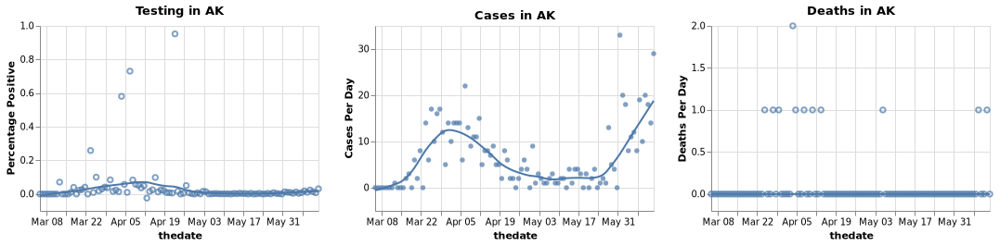

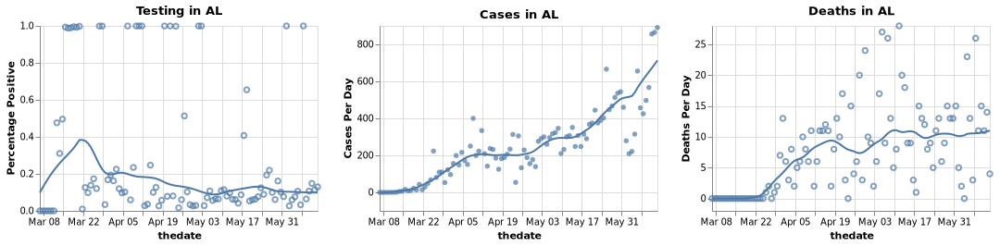

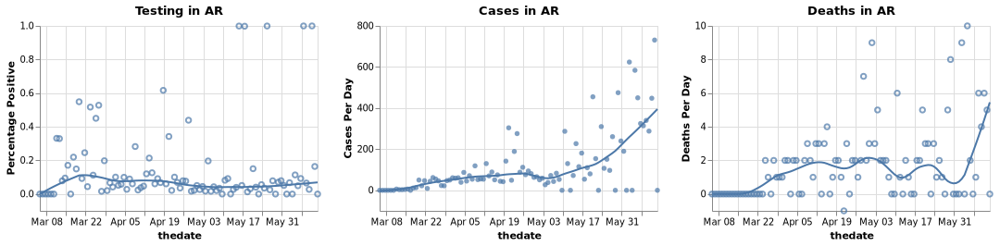

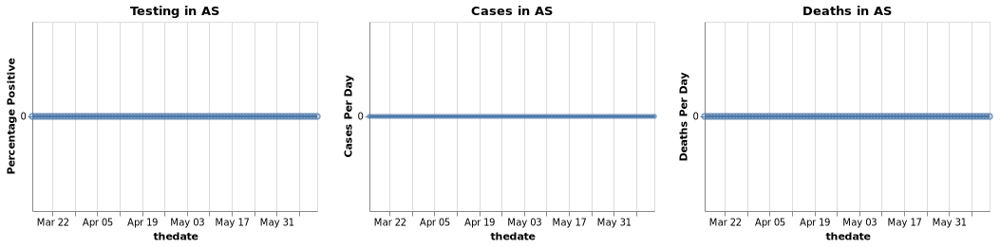

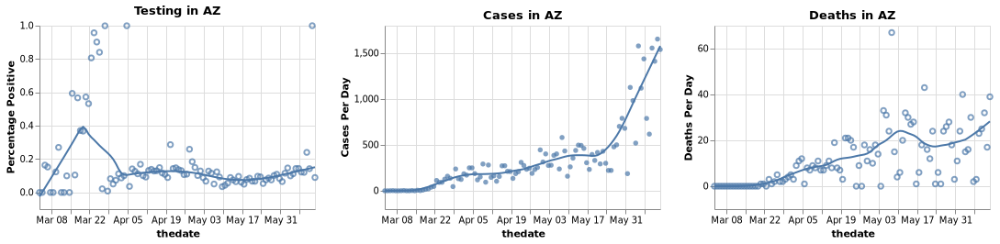

...

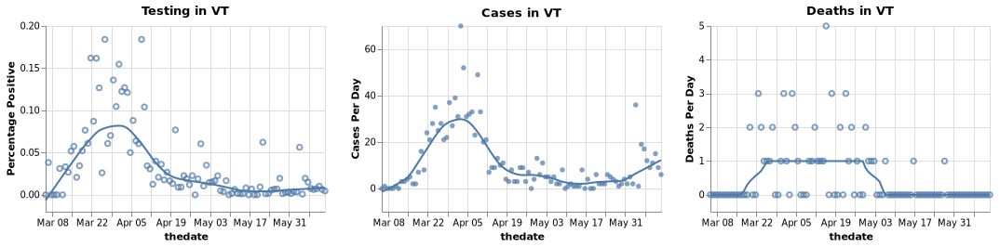

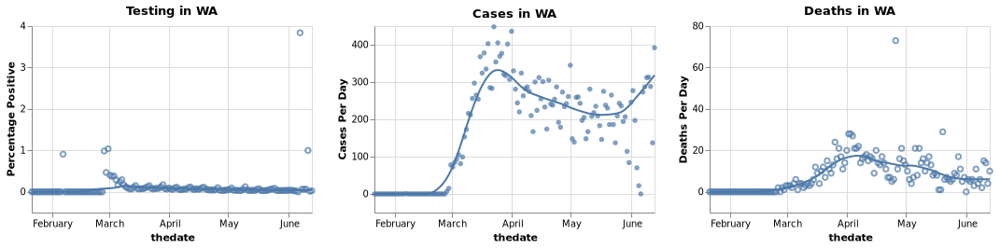

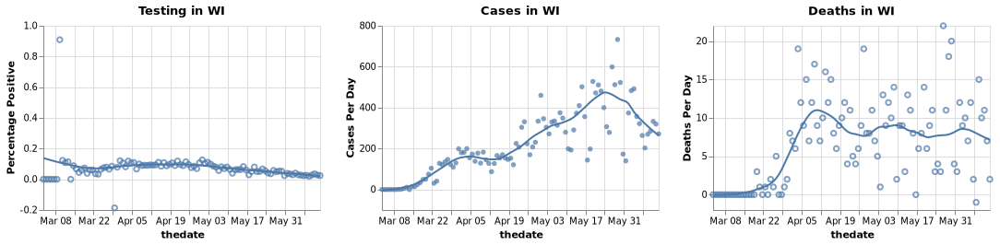

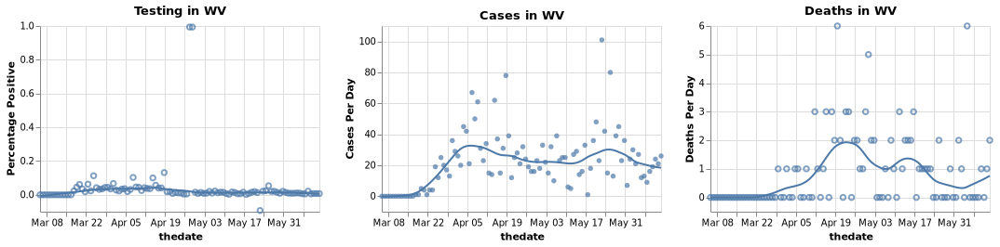

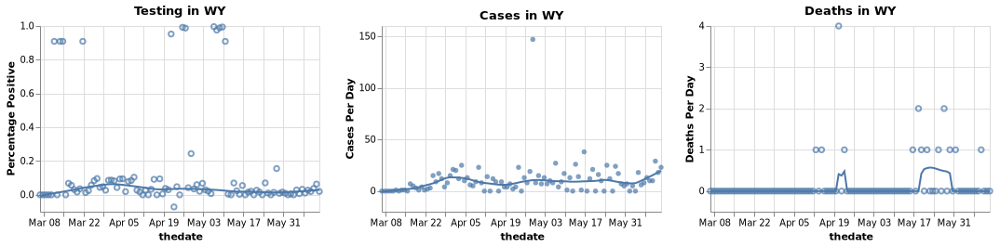

In [4]:
for i in allstates
    display(plotstate(dat2,i))
end

# Mortality Data:

Although the CDC in general doesn't have up to date mortality data
available, they have made an effort to create a variety of datasets
for COVID. They're required not to release too-specific
information. They can only do aggregated groups with more than 10
people aggregated. Obviously you'd probably like every day every
county, exactly how many people in each sex and age category
died... But this kind of data is not allowed as it quickly becomes
individually identifiable.

The most useful datasets are:

1. COVID-19 [Case Surveillance Public Use Data](https://catalog.data.gov/dataset/covid-19-case-surveillance-public-use-data)
   1. CSV at: https://data.cdc.gov/api/views/vbim-akqf/rows.csv?accessType=DOWNLOAD
2. [Provisional Death Counts by Sex,Age,State](https://catalog.data.gov/dataset/provisional-covid-19-death-counts-by-sex-age-and-state-fb69a)
   1. CSV at: https://data.cdc.gov/api/views/9bhg-hcku/rows.csv?accessType=DOWNLOAD
3. [By Place of Death and State](https://catalog.data.gov/dataset/provisional-covid-19-death-counts-by-place-of-death-and-state-936c6)
4. [By Week and State](https://catalog.data.gov/dataset/provisional-covid-19-death-counts-by-week-ending-date-and-state)
   1. CSV at: https://data.cdc.gov/api/views/r8kw-7aab/rows.csv?accessType=DOWNLOAD
5. [By Sex Age and Week](https://catalog.data.gov/dataset/provisional-covid-19-death-counts-by-sex-age-and-week)
   1. CSV at: https://data.cdc.gov/api/views/vsak-wrfu/rows.csv?accessType=DOWNLOAD
6. [Death counts by county](https://catalog.data.gov/dataset/provisional-covid-19-death-counts-in-the-united-states-by-county)
   1. CSV at: https://data.cdc.gov/api/views/kn79-hsxy/rows.csv?accessType=DOWNLOAD
7. [Weekly death counts by state and cause](https://catalog.data.gov/dataset/weekly-counts-of-deaths-by-state-and-select-causes-2019-2020)
   1. CSV at: https://data.cdc.gov/api/views/muzy-jte6/rows.csv?accessType=DOWNLOAD
8.

In [5]:
using HTTP
function grabifsmallerolder(url,filename,size,time)
    s = stat(filename)
    if(s.size < size || s.mtime < time)
        io = open(filename,"w")
        try r = HTTP.get(url,response_stream=io); catch err; 
            throw(err)
        finally 
            close(io)
        end
    end
end

covdeaths = "https://data.cdc.gov/api/views/9bhg-hcku/rows.csv?accessType=DOWNLOAD"
grabifsmallerolder(covdeaths,"covSexAgeState.csv",1e6,time()-3600*24)

HTTP.Messages.Response:
"""
HTTP/1.1 200 OK
Server: nginx
Date: Sun, 14 Jun 2020 20:29:43 GMT
Content-Type: text/csv; charset=utf-8
Transfer-Encoding: chunked
Connection: keep-alive
Access-Control-Allow-Origin: *
Content-disposition: attachment; filename=Provisional_COVID-19_Death_Counts_by_Sex__Age__and_State.csv
Cache-Control: public, must-revalidate, max-age=21600
ETag: W/"Y2hhcmxpZS43NzY0Nl8yXzI1QjVkZGUwVHZUalRVb0VlUTgzWXpzeVA2MTBZ---gzip0-70TOxquMSCcfMJ60TnwfZVuic--gzip--gzip"
X-SODA2-Data-Out-Of-Date: false
X-SODA2-Truth-Last-Modified: Wed, 10 Jun 2020 21:21:59 GMT
X-SODA2-Secondary-Last-Modified: Wed, 10 Jun 2020 21:21:59 GMT
Last-Modified: Wed, 10 Jun 2020 21:21:59 GMT
Vary: Accept-Encoding
Age: 0
X-Socrata-Region: aws-us-east-1-fedramp-prod
Strict-Transport-Security: max-age=31536000; includeSubDomains
X-Socrata-RequestId: cebf364a142d8d00815802b738608924

[Message Body was streamed]"""

Since the all deaths was a bust, let's look at COVID related dataset:


It's useful to ask which age groups are losing the most expected life
years? To answer this we can use the life expectancy tables provided
by the CDC. To make this analysis simple, we'll use tables for the
whole population against the data for both sexes.

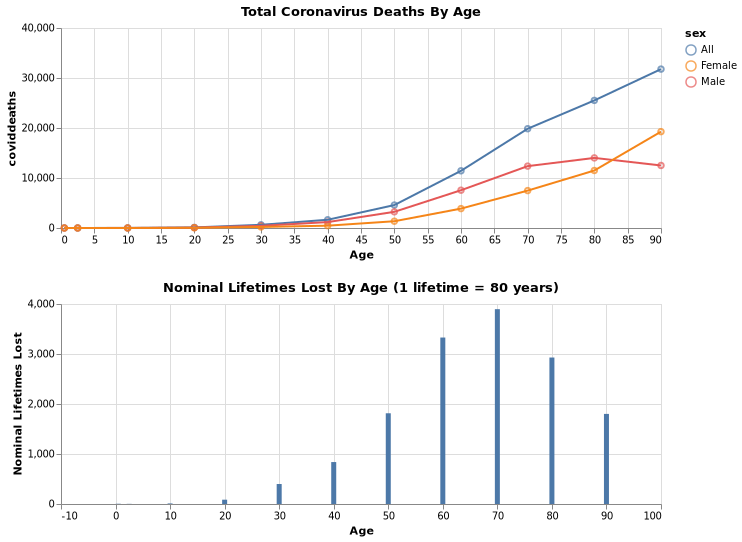

In [6]:
covdf = DataFrame(load("covSexAgeState.csv"))

agedict = Dict("Under 1 year" => 0.5, "1-4 years" => 2.5, "5-14 years" => 10.0, "15-24 years" => 20.0,
               "25-34 years" => 30.0, "35-44 years" => 40.0, 
               "45-54 years" => 50.0, "55-64 years" => 60.0, "65-74 years" => 70.0 ,
               "75-84 years" => 80.0, "85 years and over" => 90.0, "All ages"=>nothing, "All Ages" => nothing)

rename!(covdf,[:date,:startwk,:endwk,:state,:sex,:agegrp,:coviddeaths,:totdeaths,:pneumdeaths,:pneumandcovdeaths,:infldeaths,:pnuminfcovdeaths,:footnote])

covdf.agenum  = map(x -> agedict[x],covdf.agegrp)


covallagedf = covdf[map(x -> x in ["All ages","All Ages"], covdf.agegrp ),:]

filter!(x -> ! (x in ["All ages","All Ages"]),covdf)

deathsplot = covdf |> @filter(_.state == "United States" && _.sex != "Unknown") |> 
( @vlplot(layer=[]) + 
  @vlplot(:point,x={"agenum:q",title="Age"},y= {"coviddeaths:q",scale={domain=[0,40000]}},
          color="sex:n",width=600,title="Total Coronavirus Deaths By Age") +
  @vlplot(:line,x="agenum:q",y="coviddeaths:q",color="sex:n"))

lifetable = "https://ftp.cdc.gov/pub/Health_Statistics/NCHS/Publications/NVSR/68_07/Table01.xlsx"

grabifsmallerolder(lifetable,"alllife.xlsx",100,time()+3600*12);

ltd = DataFrame(load("alllife.xlsx","Table 1!A4:G104"))
rename!(ltd,[:agegrp,:qx,:nsurv,:ndie,:pylived,:pylivedabov,:expect])

ltd.age = 1:100

lyldf = DataFrame(covdf |> @filter(_.sex == "All" && _.agenum != nothing) |> 
                  @mutate(lyl = _.coviddeaths * ltd[Int(round(_.agenum +.1)),:expect]))



lylplot = lyldf |>@mutate(ltl=_.lyl/80)|> @vlplot(:bar,x={"agenum:q",title="Age"},y={"ltl:q",title="Nominal Lifetimes Lost"},width=600,
                                        title="Nominal Lifetimes Lost By Age (1 lifetime = 80 years)")
display([deathsplot; lylplot]);

The CDC Through Data.gov has made available a de-identified
individualized case database of COVID cases:

In [7]:
covidcases="https://data.cdc.gov/api/views/vbim-akqf/rows.csv?accessType=DOWNLOAD"

grabifsmallerolder(covidcases,"covidcasespub.csv",1000000,time()-3600*24);

covcasedf = DataFrame(load("covidcasespub.csv"))

,current_status,cdc_report_dt,sex,age_group,pos_spec_dt,hosp_yn
,String,Date,String,String,Date,String
1,Laboratory-confirmed case,2020-03-16,Unknown,10 - 19 Years,2020-03-13,No
2,Laboratory-confirmed case,2020-03-17,Male,10 - 19 Years,2020-03-13,Unknown
3,Laboratory-confirmed case,2020-03-23,Male,10 - 19 Years,2020-03-13,No
4,Laboratory-confirmed case,2020-03-20,Male,10 - 19 Years,2020-03-13,No
5,Laboratory-confirmed case,2020-03-27,Male,10 - 19 Years,2020-03-13,No
6,Laboratory-confirmed case,2020-03-19,Male,10 - 19 Years,2020-03-13,Unknown
7,Laboratory-confirmed case,2020-03-27,Male,10 - 19 Years,2020-03-13,No
8,Laboratory-confirmed case,2020-03-19,Male,10 - 19 Years,2020-03-13,Unknown
9,Laboratory-confirmed case,2020-04-08,Male,10 - 19 Years,2020-03-13,No


Manipulating data is sometimes easier if you can use a well developed
language to manipulate it. Fortunately, the SQLite library is an
excellent tool for manipulating large datasets in a self-contained
database file, without all the complexity of a database management
system like Mariadb/MySQL or PostgreSQL. We can access SQLite from
Julia. It is somewhat slower than in R at the moment, but still fast
enough for our purposes. Hopefully in the future it will be even
better.

In [8]:
using SQLite

db = SQLite.DB("coviddb.db")

SQLite.drop!(db,"CovidCases";ifexists=true);
SQLite.load!(covcasedf,db,"CovidCases";ifnotexists=true);

Let's grab all deaths by day, aggregated by age group:

In [9]:
byagedeaths = DBInterface.execute(db,"select cdc_report_dt,count(*) as N,age_group,death_yn from CovidCases group by cdc_report_dt,age_group,death_yn") |> DataFrame

first(byagedeaths,10)

,cdc_report_dt,N,age_group,death_yn
,Date,Int64,String,String
1,2020-04-21,93,0 - 9 Years,No
2,2020-04-21,107,0 - 9 Years,Unknown
3,2020-04-21,242,10 - 19 Years,No
4,2020-04-21,297,10 - 19 Years,Unknown
5,2020-04-21,1,10 - 19 Years,Yes
6,2020-04-21,858,20 - 29 Years,No
7,2020-04-21,1215,20 - 29 Years,Unknown
8,2020-04-21,4,20 - 29 Years,Yes
9,2020-04-21,972,30 - 39 Years,No


Now a graph that shows 40-50 year old death rates:

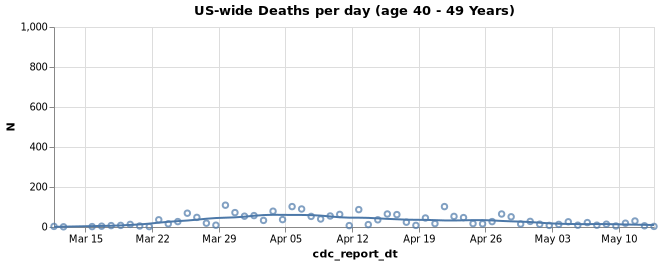

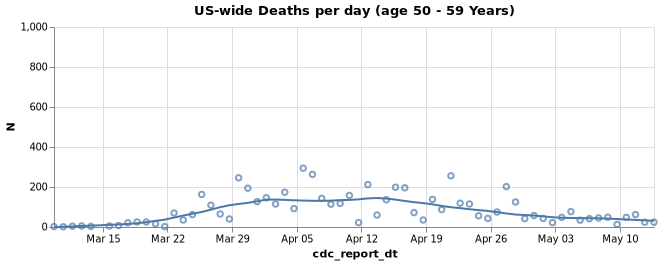

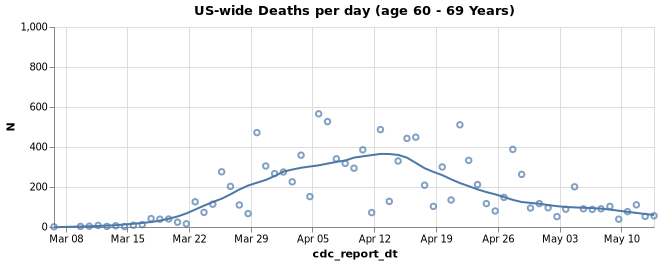

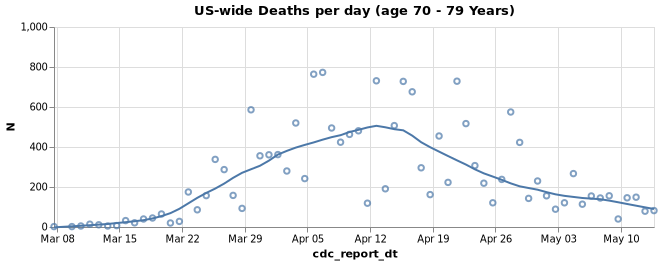

In [10]:
function plotdeaths(df,agegroup)
    df |> @filter(_.age_group == agegroup && _.death_yn == "Yes") |> 
        @vlplot(layer=[],title="US-wide Deaths per day (age $agegroup)",width=600) + 
        @vlplot(:point,x=:cdc_report_dt,y={:N,scale={domain=[0,1000]}},) + 
        @vlplot(:line,x=:cdc_report_dt,y=:N,transform=[{loess=:N, on=:cdc_report_dt,bandwidth=.2}])
end


plot40 = byagedeaths |> x->plotdeaths(x,"40 - 49 Years")
plot50 = byagedeaths |> x->plotdeaths(x,"50 - 59 Years")
plot60 = byagedeaths |> x->plotdeaths(x,"60 - 69 Years")
plot70 = byagedeaths |> x->plotdeaths(x,"70 - 79 Years")

map(display,[plot40,plot50,plot60,plot70]);